# <font color='blue'>Projeto Machine Learning Clusterização</font>

## <font>Agrupamento de Clientes Por Consumo de Energia</font>


A partir de dados de consumo de energia de clientes, nosso trabalho é agrupar os consumidores por similaridade a afim de compreender o comportamento dos clientes e sua relação com o consumo de energia.

Arquivo de dados: https://archive.ics.uci.edu/ml/datasets/Individual+household+electric+power+consumption

Nosso projeto será baseado na metodologia CRISP-DM, que é a abreviação de Cross Industry Standard Process for Data Mining, que pode ser traduzido como Processo Padrão Inter-Indústrias para Mineração de Dados. É um modelo de processo de mineração de dados que descreve abordagens comumente usadas por especialistas em mineração de dados para atacar problemas. É formada por 6 etapas bem definidas:

1. **Business Understanding**
2. **Data Understanding**
3. **Data Preparation**
4. **Modeling**
5. **Evaluation**
6. **Deployment**

## Etapa 1 CRISP-DM: Entendimento do negócio

Como primeira etapa do CRISP-DM, vamos entender do que se trata o negócio e quais os objetivos.

Este é um problema de Consumo Individual de Energia Elétrica Doméstica. Nosso objetivo principal é através das análises exploratórias e também por meio de algoritmos de machine learning, conseguir agrupar e separar os indivíduos dessa base de dados para que possamos tomar atitudes baseadas em dados.

Então, como objetivo da modelagem é fazer uma clusterização, usaremos o KMeans para segmentar nossos clientes.

## Etapa 2 CRISP-DM: Entendimento dos dados

A segunda etapa é o entendimento dos dados. Foram fornecidas 9 variáveis. O significado de cada uma dessas variáveis se encontra na tabela.


**Dicionário de dados**

Os dados estão dispostos em uma tabela com uma linha para cada cliente, e uma coluna para cada variável armazenando as características desses clientes. Colocamos uma cópia o dicionário de dados (explicação dessas variáveis) abaixo neste notebook:

| Variable Name            | Description                                         | Tipo  |
| ------------------------ |:---------------------------------------------------:| -----:|
| Date| Data no formato dd/mm/aaaa|Categorical|
| Time| hora no formato hh:mm:ss |Categorical|
| Global_active_power|potência ativa média por minuto global doméstica (em quilowatts)|Categorical|
| Global_reactive_power| potência reativa média por minuto global doméstica (em quilowatts) |Categorical|
| Voltage|voltagem média por minuto (em volts)  | Categorical|
| Global_intensity | intensidade de corrente média por minuto global doméstica (em amperes) | Categorical |
| Sub_metering_1 | ubmedição de energia nº 1 (em watt-hora de energia ativa). Corresponde à cozinha, contendo principalmente uma máquina de lavar louça, um forno e um micro-ondas (os fogões não são elétricos, mas movidos a gás)| Categorical |
| Sub_metering_2 | submedição de energia nº 2 (em watt-hora de energia ativa). Corresponde à lavanderia, contendo uma máquina de lavar, uma secadora, uma geladeira e uma luz. |Categorical|
| Sub_metering_3 | submedição de energia nº 3 (em watt-hora de energia ativa). Corresponde a um aquecedor de água elétrico e a um ar-condicionado. |Continuous|


#### Carregando os pacotes


In [12]:

import pandas as                      pd
import numpy as                       np
import seaborn as                     sns
import matplotlib.pyplot as           plt
import plotly.express as              px
import                                warnings

from matplotlib import                pylab
from sklearn.cluster import           KMeans
from sklearn.decomposition import     PCA
from sklearn.model_selection import   train_test_split
from scipy.spatial.distance import    cdist, pdist
from sklearn.metrics import           silhouette_score
from sklearn.preprocessing import     MinMaxScaler


warnings.filterwarnings("ignore")
%matplotlib inline

In [13]:
#setando uma paleta e configurando plots
custom_params = {"axes.spines.right":False,"axes.spines.top":False}
sns.set_theme(style='ticks',rc=custom_params)
color_palette = ['#264653','#e9c46a','#2a9d8f', '#f4a261', '#e76f51', '#8a5a44']
sns.set_palette(sns.color_palette(color_palette))
sns.color_palette(color_palette)

[(0.14901960784313725, 0.27450980392156865, 0.3254901960784314),
 (0.9137254901960784, 0.7686274509803922, 0.41568627450980394),
 (0.16470588235294117, 0.615686274509804, 0.5607843137254902),
 (0.9568627450980393, 0.6352941176470588, 0.3803921568627451),
 (0.9058823529411765, 0.43529411764705883, 0.3176470588235294),
 (0.5411764705882353, 0.35294117647058826, 0.26666666666666666)]

#### Carregando os Dados
O comando pd.read_csv é um comando da biblioteca pandas (pd.) e carrega os dados do arquivo csv indicado para um objeto dataframe do pandas.

In [15]:
# Carregando os dados
dataset =  pd.read_csv("household_power_consumption.txt",delimiter = ';')
dataset.head()

,Date,Time,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
0,16/12/2006,17:24:00,4.216,0.418,234.840,18.400,0.000,1.000,17.0
1,16/12/2006,17:25:00,5.360,0.436,233.630,23.000,0.000,1.000,16.0
2,16/12/2006,17:26:00,5.374,0.498,233.290,23.000,0.000,2.000,17.0
3,16/12/2006,17:27:00,5.388,0.502,233.740,23.000,0.000,1.000,17.0
4,16/12/2006,17:28:00,3.666,0.528,235.680,15.800,0.000,1.000,17.0


In [16]:
# Visualizando informações sobre o dataset
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075259 entries, 0 to 2075258
Data columns (total 9 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   Date                   object 
 1   Time                   object 
 2   Global_active_power    object 
 3   Global_reactive_power  object 
 4   Voltage                object 
 5   Global_intensity       object 
 6   Sub_metering_1         object 
 7   Sub_metering_2         object 
 8   Sub_metering_3         float64
dtypes: float64(1), object(8)
memory usage: 142.5+ MB


Então podemos ver algumas informações interessantes.
Temos mais de 2 Milhões de dados/linhas em nosso data frame, o que é algo muito grande, vamos pegar apenas uma fração desses dados para fazermos o modelo e análises, se não vai ficar extremamente pesado para o nosso projeto.

In [18]:
dataset.shape

(2075259, 9)

2075259 linhas e 9 colunas

In [20]:
dataset.isna().sum()

Date                         0
Time                         0
Global_active_power          0
Global_reactive_power        0
Voltage                      0
Global_intensity             0
Sub_metering_1               0
Sub_metering_2               0
Sub_metering_3           25979
dtype: int64

Sub_metering_3 contém 25979 valores missings

In [22]:
(dataset["Sub_metering_3"].isna().sum()/dataset.shape[0])*100

1.2518437457686005

Como representa apenas 1% do dataframe eu irei dropar esses valores missings 

In [24]:
dataset.dropna(inplace=True)

In [25]:
#na verdade vamos trabalhar apenas com uma fração desses dados nesse projeto.
df, amostra2 = train_test_split(dataset, train_size = .01)
df.shape

(20492, 9)

20492 é o suficiente para trabalharmos e criar o modelo

In [27]:
df.head(3)

,Date,Time,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
608008,11/2/2008,22:52:00,1.294,0.000,238.760,5.400,0.000,0.000,0.0
1966204,12/9/2010,03:28:00,4.330,0.050,239.870,18.000,38.000,2.000,18.0
427457,9/10/2007,13:41:00,0.328,0.100,241.550,1.400,0.000,0.000,0.0


*Como nossa base de dados veio com os dados em formatos errados, vamos ter q fazer uma manobra nos passos da CRISP-DM. Antes de entermos melhor as variáveis e os dados em si, precisamos avançar para parte 3 que seria a preparação dos dados para depois fazermos nossas descritivas. Então vamos alterar o formato dos dados*

In [29]:
df['Voltage'] = df['Voltage'].astype(dtype = 'float64')
df['Global_active_power'] = df['Global_active_power'].astype(dtype = 'float64')
df['Global_reactive_power'] = df['Global_reactive_power'].astype(dtype = 'float64')
df['Global_intensity'] = df['Global_intensity'].astype(dtype = 'float64')
df['Sub_metering_1'] = df['Sub_metering_1'].astype(dtype = 'float64')
df['Sub_metering_2'] = df['Sub_metering_2'].astype(dtype = 'float64')
df['Sub_metering_3'] = df['Sub_metering_3'].astype(dtype = 'float64')


In [30]:
df['DateTime'] = pd.to_datetime(df['Date'] + ' ' + df['Time'], dayfirst=True)
df.drop(columns=['Time','Date'],inplace=True)
df = df.reset_index(drop=True)

O que foi feito foi a alteração dos tipos de dados presentes em cada variável, agora estão com formatos coerentes. Além de também deletar a coluna Time e Date e junta-las em uma só.

In [32]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20492 entries, 0 to 20491
Data columns (total 8 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   Global_active_power    20492 non-null  float64       
 1   Global_reactive_power  20492 non-null  float64       
 2   Voltage                20492 non-null  float64       
 3   Global_intensity       20492 non-null  float64       
 4   Sub_metering_1         20492 non-null  float64       
 5   Sub_metering_2         20492 non-null  float64       
 6   Sub_metering_3         20492 non-null  float64       
 7   DateTime               20492 non-null  datetime64[ns]
dtypes: datetime64[ns](1), float64(7)
memory usage: 1.3 MB


In [33]:
df.head(3)

,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3,DateTime
0,1.294,0.00,238.76,5.4,0.0,0.0,0.0,2008-02-11 22:52:00
1,4.330,0.05,239.87,18.0,38.0,2.0,18.0,2010-09-12 03:28:00
2,0.328,0.10,241.55,1.4,0.0,0.0,0.0,2007-10-09 13:41:00


#### Entendimento dos dados - Univariada
Nesta etapa tipicamente avaliamos a distribuição de todas as variáveis. Nesta demonstração vamos ver a variável resposta e dois exemplos de univariada apenas. Mas sinta-se à vontade para tentar observar outras variáveis.

**Abaixo podemos ver a distribuição de nossas variáveis numéricas**

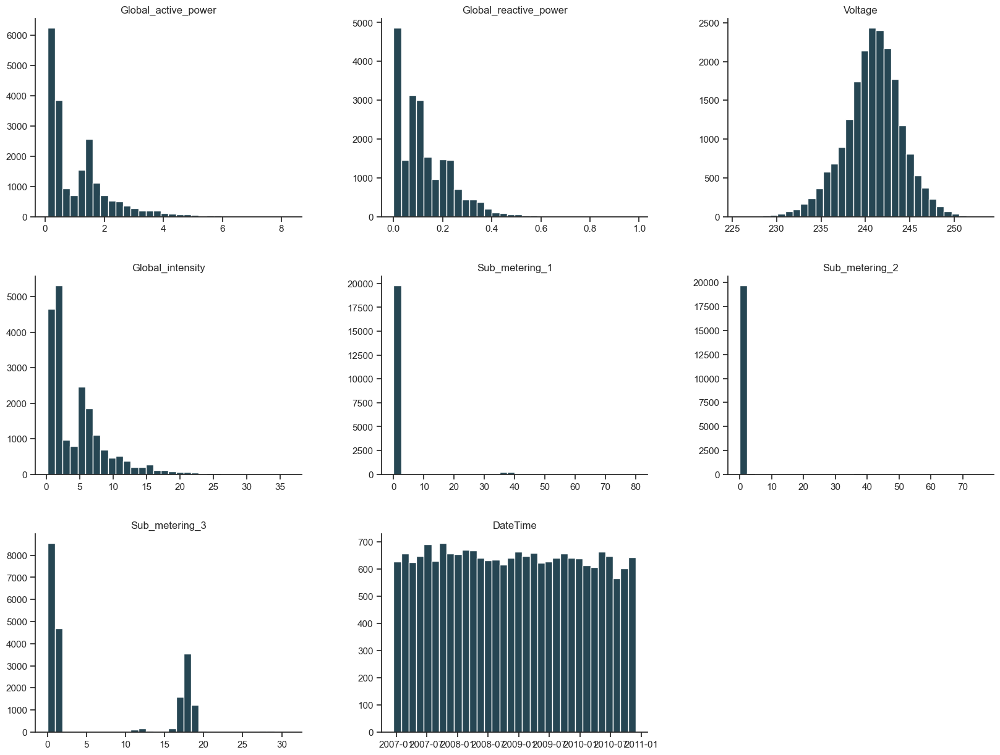

In [36]:
df.hist(bins=32,figsize=(20,15),grid=False);

**Outra maneira de vizualizar, agora tendo acesso aos quartis e aos outliers**

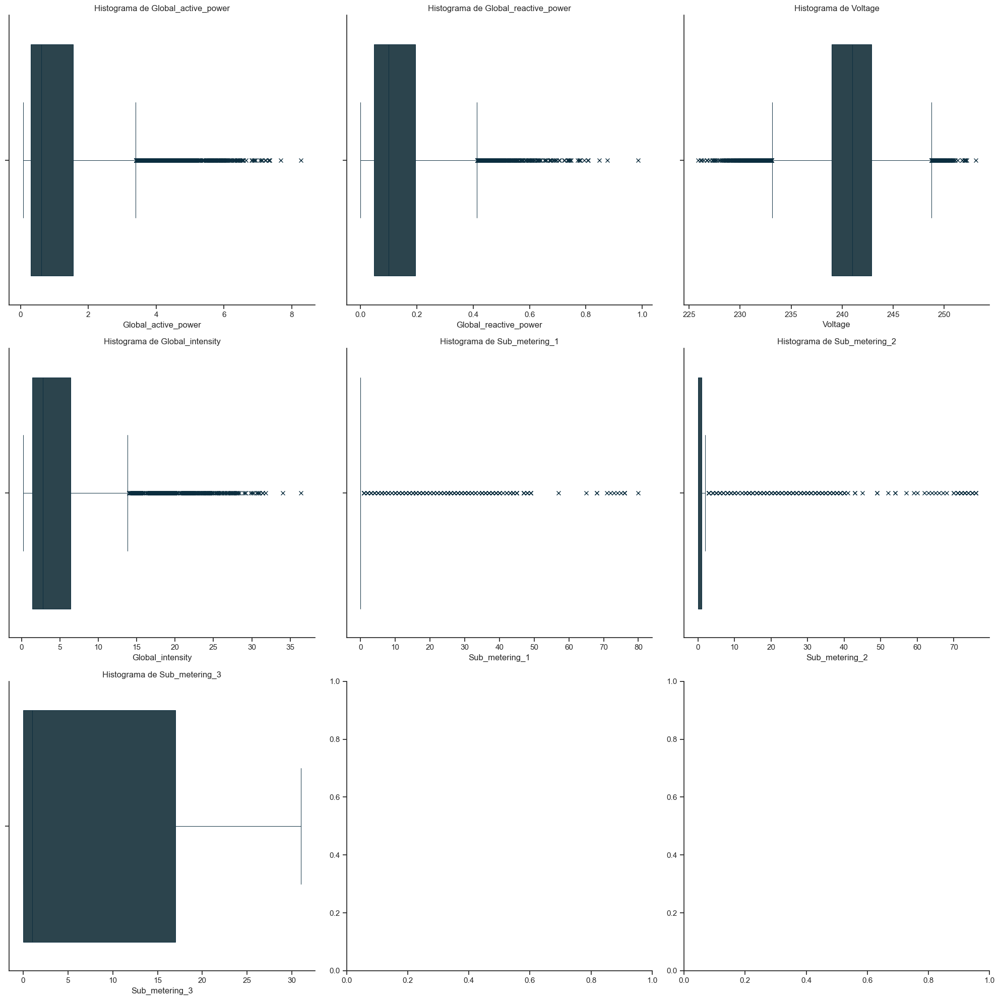

In [38]:
num_cols = df.select_dtypes(include='number').columns
num_plots = len(num_cols)

quant_col = df.select_dtypes(['int','float']).columns.tolist()

fig, axes = plt.subplots(nrows=(num_plots // 3) + 1, ncols=3, figsize=(20, 20))
axes = axes.flatten()

for i, col in enumerate(num_cols):
    sns.boxplot(data=df, x=col,linecolor="#0b2d3e", palette="mako_r",linewidth=.7,flierprops={"marker": "x"}, ax=axes[i])
    axes[i].set_title(f'Histograma de {col}')
    axes[i].grid(False)

plt.tight_layout()
plt.show()

**Conferindo como se comportam ao longo do tempo**

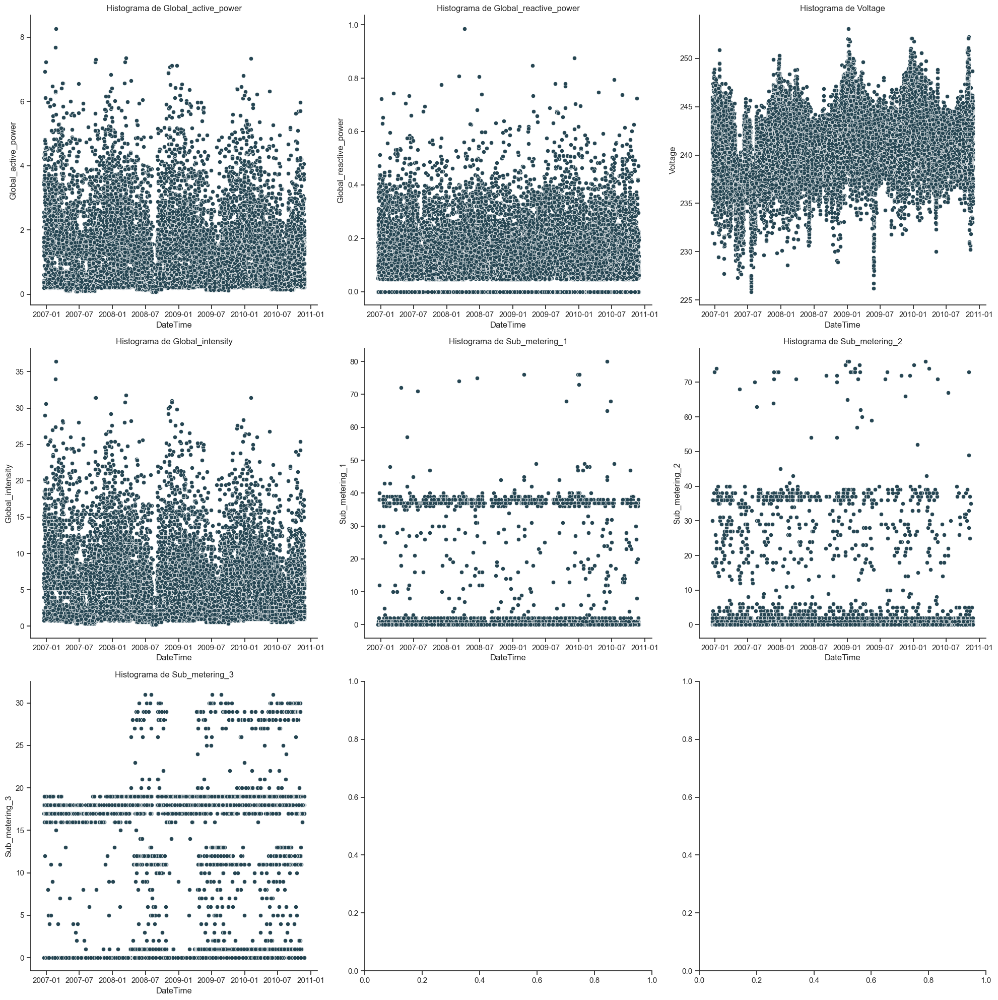

In [40]:
num_cols = df.select_dtypes(include='number').columns
num_plots = len(num_cols)


fig, axes = plt.subplots(nrows=(num_plots // 3) + 1, ncols=3, figsize=(20, 20))
axes = axes.flatten()

for i, col in enumerate(num_cols):
    sns.scatterplot(data=df, x="DateTime" ,y=col, ax=axes[i],palette="mako_r")
    axes[i].set_title(f'Histograma de {col}')
    axes[i].grid(False)

plt.tight_layout()
plt.show()

**Verifiando agora a correlação**

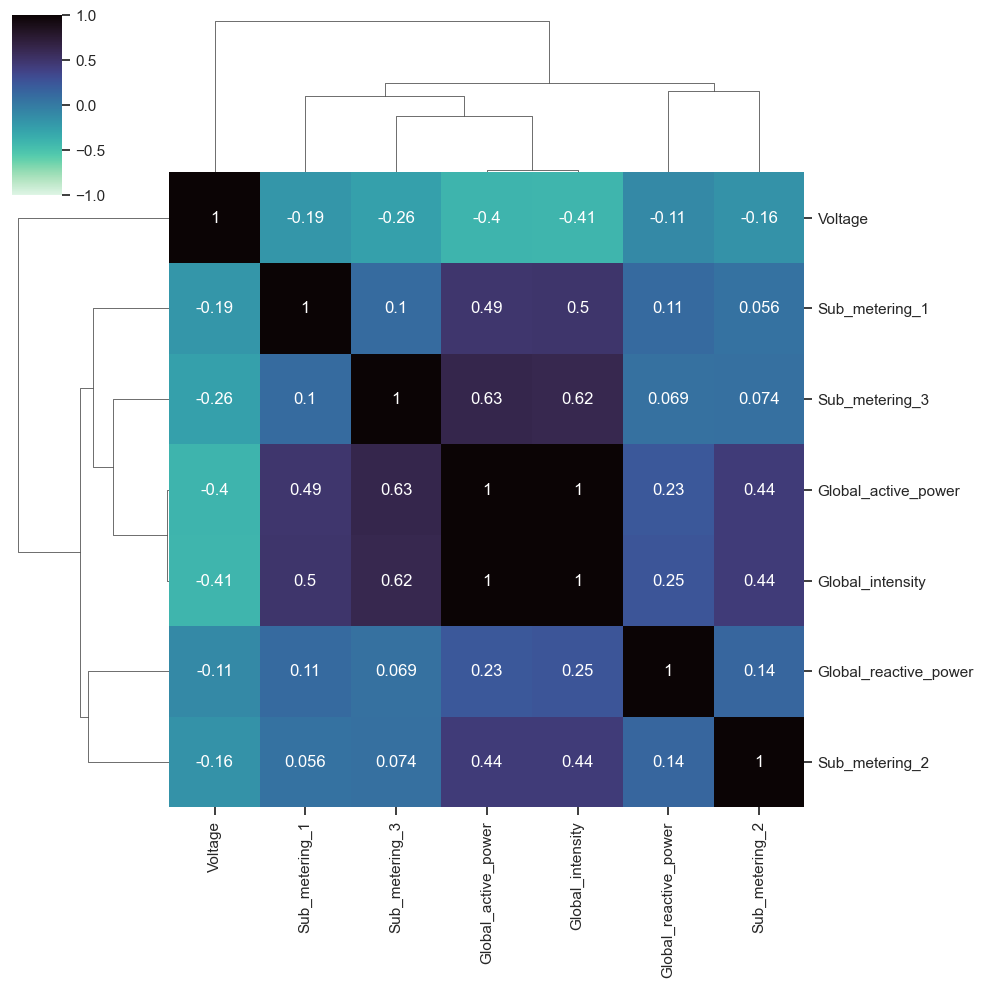

In [42]:
sns.clustermap(df.drop(columns=['DateTime']).corr(),annot=True,vmin=-1,vmax=1,cmap="mako_r")

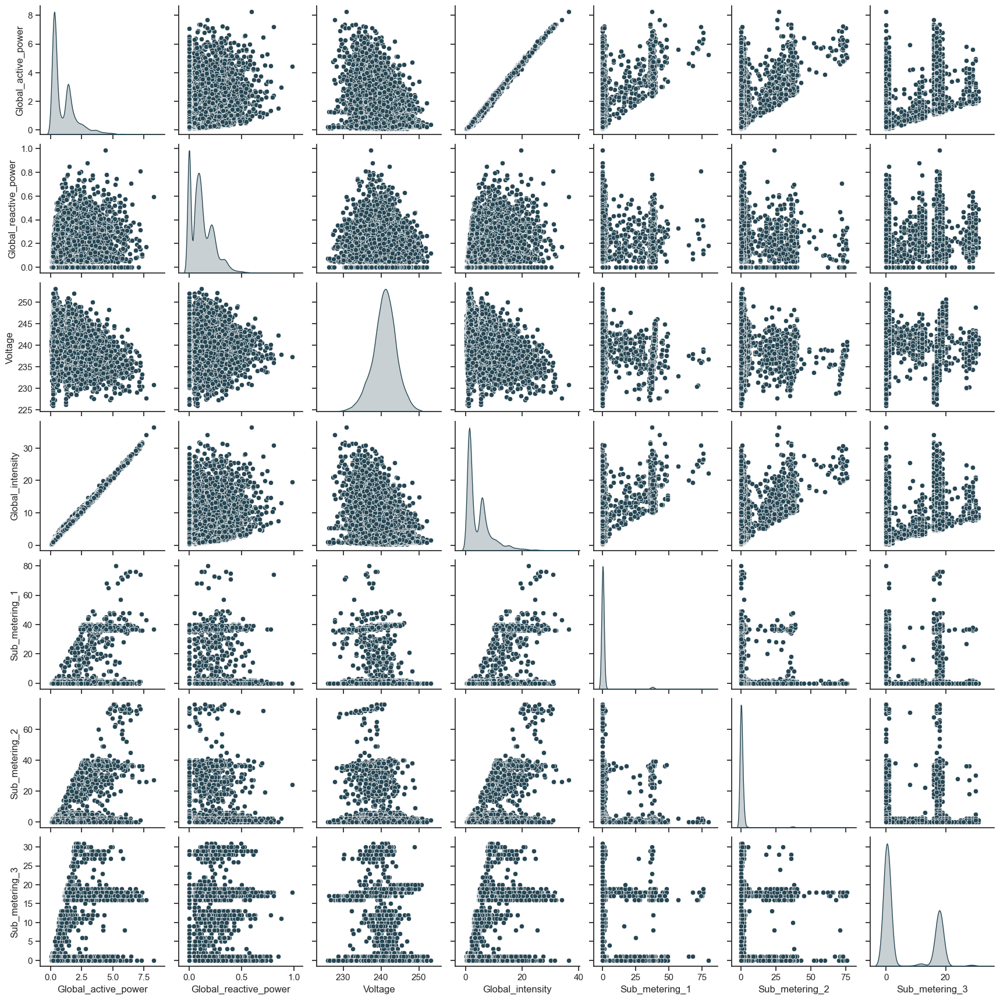

In [43]:
sns.pairplot(df,diag_kind = 'kde')

## Etapa 3 Crisp-DM: Preparação dos dados 
Nessa etapa realizamos tipicamente as seguintes operações com os dados:
- seleção
- limpeza
- construção
- integração
- formatação



Porém como foi supracitado na etapa anterior, já tratamos os dados, eliminando as variáveis vazias, pois eram em apenas uma coluna e representava cerca de 1% apenas dos dados. Então fizemos a divisão para pegarmos apenas uma fatia desses 2 milhões de dados que tinhamos, e fizemos a correção do `Schema` (schema é a relação da variável e o tipo de dado em que ela se encontra). O que nos resta para trabalhar com os dados é coloca-los numa escala favorável para o modelo e aplicar uma análise de componentes principais sobre eles.

Vamos precisar separar uma nova cópia desse dataset para desenvolvermos nosso modelo de Machine Learning. Nessa cópia não pode haver coluna com datas nem colunas categorizadas.

In [49]:
df.columns

Index(['Global_active_power', 'Global_reactive_power', 'Voltage',
       'Global_intensity', 'Sub_metering_1', 'Sub_metering_2',
       'Sub_metering_3', 'DateTime'],
      dtype='object')

In [50]:
from sklearn.preprocessing import MinMaxScaler

df_ml = df.drop(columns=['DateTime'])

scaler = MinMaxScaler()
df_scale = scaler.fit_transform(df_ml)
df_scale

array([[0.14836506, 0.        , 0.4737422 , ..., 0.        , 0.        ,
        0.        ],
       [0.51878965, 0.05070994, 0.51450606, ..., 0.475     , 0.02631579,
        0.58064516],
       [0.03050268, 0.10141988, 0.57620272, ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.47657394, 0.07099391, 0.37825927, ..., 0.        , 0.        ,
        0.5483871 ],
       [0.06149341, 0.18052738, 0.36871098, ..., 0.        , 0.01315789,
        0.        ],
       [0.01464129, 0.12778905, 0.39845758, ..., 0.        , 0.        ,
        0.        ]])

In [51]:
pca = PCA()
pca_ = pca.fit_transform(df_scale)

name = [f"CP{x+1}" for x in list(range(df_ml.shape[1]))]
pca_df = pd.DataFrame(data = pca_,columns=name)

pca_df

,CP1,CP2,CP3,CP4,CP5,CP6,CP7
0,-0.162999,0.092553,-0.160510,0.025725,0.004968,0.070261,-0.001294
1,0.608275,0.288575,-0.107036,0.294906,-0.290274,-0.103775,-0.002603
2,-0.249190,-0.011197,-0.013118,-0.009638,-0.003773,-0.004844,-0.000904
3,-0.162548,0.112828,-0.030523,0.025428,-0.000238,0.071323,-0.002344
4,0.365509,0.054545,-0.051046,-0.251452,-0.005639,0.007443,0.000275
...,...,...,...,...,...,...,...
20487,0.532531,0.173367,0.173239,0.025908,0.244687,-0.112444,0.010749
20488,0.402087,-0.116365,0.045065,-0.013918,-0.002971,0.007051,-0.001999
20489,0.543583,0.180393,-0.135651,0.053555,0.010261,0.185900,0.002197
20490,-0.191830,0.118482,-0.067219,-0.178306,0.003914,-0.003817,-0.001598


In [52]:
pca.explained_variance_ratio_.cumsum()

array([0.63605136, 0.79037335, 0.87081177, 0.94213371, 0.98333693,
       0.99992305, 1.        ])

<Axes: xlabel='None', ylabel='First'>

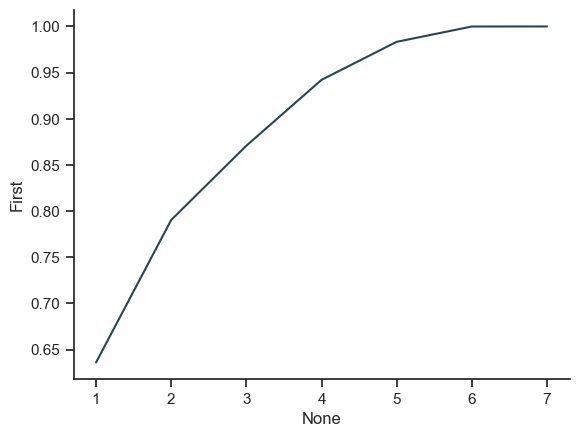

In [53]:
mydf= pd.Series(pca.explained_variance_ratio_.cumsum().tolist()).to_frame()
mydf.rename(columns={0:'First'},inplace=True)
sns.lineplot(data=mydf,x=mydf.index+1,y='First')

In [54]:
pca = PCA(n_components=3)
pca = pca.fit_transform(df_scale)

pca

array([[-0.16299932,  0.09255347, -0.1605102 ],
       [ 0.608275  ,  0.28857482, -0.10703566],
       [-0.24918962, -0.01119702, -0.01311782],
       ...,
       [ 0.54358301,  0.18039287, -0.13565099],
       [-0.19182955,  0.11848189, -0.06721871],
       [-0.23050805,  0.04645817, -0.09095253]])

## Etapa 4 Crisp-DM: Modelagem

Nessa etapa, realizaremos a construção do modelo de clusterização. Os passos típicos são:

Seleção da Técnica de Modelagem
Para esse projeto de segmentação de consumidores de energia, utilizaremos a técnica de K-Means, que é amplamente usada em problemas de clusterização. O K-Means é um algoritmo simples, porém poderoso, que agrupa indivíduos com base em características semelhantes, distribuindo-os em clusters ou grupos distintos. Isso nos permitirá identificar padrões de comportamento no consumo de energia entre os clientes, facilitando a compreensão de diferentes perfis de consumo.

Além disso, aplicamos PCA (Análise de Componentes Principais) para reduzir a dimensionalidade dos dados e garantir que o modelo de clusterização se beneficie de uma representação mais compacta e eficiente. Também usamos o MinMaxScaler para normalizar os dados e garantir que as variáveis estejam na mesma escala, o que é essencial para o desempenho do K-Means.

In [ ]:
k_range = range(1,12)

# Aplicando o modelo K-Means para cada valor de K (esta célula pode levar bastante tempo para ser executada)
k_means_var = [KMeans(n_clusters = k).fit(pca) for k in k_range]

# Ajustando o centróide do cluster para cada modelo
centroids = [X.cluster_centers_ for X in k_means_var]

# Calculando a distância euclidiana de cada ponto de dado para o centróide
k_euclid = [cdist(pca, cent, 'euclidean') for cent in centroids]
dist = [np.min(ke, axis = 1) for ke in k_euclid]

# Soma dos quadrados das distâncias dentro do cluster
soma_quadrados_intra_cluster = [sum(d**2) for d in dist]

# Soma total dos quadrados
soma_total = sum(pdist(pca)**2)/pca.shape[0]

# Soma dos quadrados entre clusters
soma_quadrados_inter_cluster = soma_total - soma_quadrados_intra_cluster

# Curva de Elbow
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(k_range, soma_quadrados_inter_cluster/soma_total * 100, 'b*-')
ax.set_ylim((0,100))
plt.grid(True)
plt.xlabel('Número de Clusters')
plt.ylabel('Percentual de Variância Explicada')
plt.title('Variância Explicada x Valor de K')

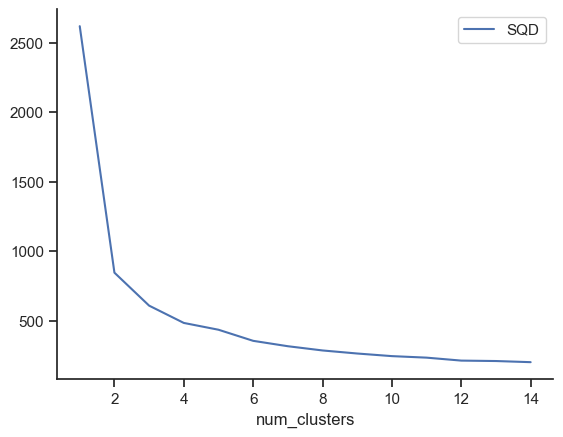

In [65]:
SQD = []
K = range(1,15)
for k in (K):
    km = KMeans(n_clusters=k)
    km = km.fit(pca)
    SQD.append(km.inertia_)

elbow = pd.DataFrame({'num_clusters': list(range(1, len(SQD)+1)), 'SQD': SQD})
elbow.plot(x = 'num_clusters', y = 'SQD',color='b');

In [66]:
soma_quadrados_inter_cluster/soma_total * 100

array([-1.06290619e-10,  6.77394439e+01,  7.68017677e+01,  8.15551366e+01,
        8.46187736e+01,  8.46511746e+01,  8.79565909e+01,  8.91177591e+01,
        8.98575616e+01,  9.06660608e+01,  9.11441539e+01])

In [67]:
pca_df = pd.DataFrame(pca)
pca_df.head()

,0,1,2
0,-0.162999,0.092553,-0.160510
1,0.608275,0.288575,-0.107036
2,-0.249190,-0.011197,-0.013118
3,-0.162548,0.112828,-0.030523
4,0.365509,0.054545,-0.051046


In [68]:
silhuetas = []
max_cluster = 10

for n_clusters in range(2, max_cluster):
    km = KMeans(n_clusters=n_clusters).fit(pca)
    silhuetas.append(silhouette_score(pca, km.labels_))
    nomes = [f'grupo_{g}' for g in range(n_clusters)]
    pca_df['grupos_' + str(n_clusters)] = pd.Categorical(km.labels_, categories=range(n_clusters), ordered=True)


<Axes: >

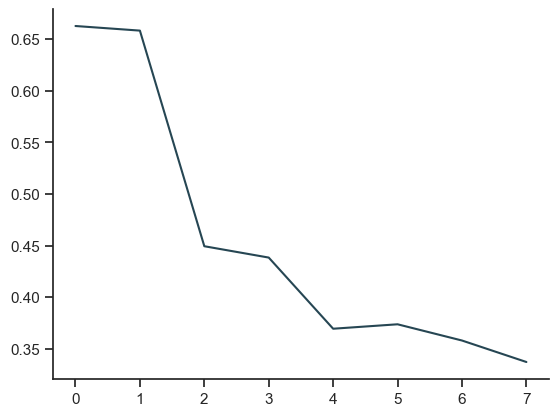

In [69]:
pd.Series(silhuetas).plot()

In [70]:
# Criando um modelo com K = 8
modelo_v1 = KMeans(n_clusters = 8)
modelo_v1.fit(pca)

KMeans()

In [71]:
# Silhouette Score
labels = modelo_v1.labels_
silhouette_score(pca, labels, metric = 'euclidean')

0.3670092720829688

In [72]:
# Criando um modelo com K = 4
modelo_v2 = KMeans(n_clusters = 4)
modelo_v2.fit(pca)

KMeans(n_clusters=4)

In [73]:
labels = modelo_v2.labels_
silhouette_score(pca, labels, metric = 'euclidean')

0.44942435253056295

Criando o Cluster Map com os clusters do Modelo V2 que apresentou melhor Silhouette Score.

In [75]:
# Cria o cluster map
cluster_map = df.copy()
cluster_map['Global_active_power'] = pd.to_numeric(cluster_map['Global_active_power'])
cluster_map['cluster'] = modelo_v2.labels_
cluster_map.drop(columns=['DateTime'],inplace=True)

## Etapa 5 CRISP-DM: Avaliação dos resultados
Na fase de avaliação do CRISP-DM, o objetivo é entender o desempenho do modelo de clusterização aplicado e como ele contribui para o projeto. No nosso caso, usamos o algoritmo K-Means para agrupar os dados transformados pelas três componentes principais do PCA, testando diferentes números de clusters.

Para realizar uma boa avaliação de clusterização, usamos métricas como o Silhouette Score, que mede a coesão e separação dos clusters. Os resultados obtidos foram:

- Silhouette Score com K=8: 0.3670
- Silhouette Score com K=4: 0.4494

**Análise do Silhouette Score**
O Silhouette Score é uma métrica que varia de -1 a 1:

- Valores próximos de 1 indicam que os clusters estão bem separados e que os pontos estão fortemente agrupados dentro de seu próprio cluster.
- Valores próximos de 0 indicam que os clusters estão sobrepostos, com pontos muito próximos dos limites dos clusters.
- Valores negativos indicam que muitos pontos estão mal alocados, ou seja, dentro do cluster errado.
No nosso caso, o melhor resultado foi obtido com K=4, com um Silhouette Score de 0.4494, o que indica uma separação moderada entre os clusters.

**Comparação com a Curva de Elbow**

Além do Silhouette Score, analisamos a Curva de Elbow, que nos ajuda a visualizar a soma dos quadrados dentro e entre clusters. Esta curva nos permite verificar como a variância explicada aumenta à medida que o número de clusters aumenta. No entanto, após certo ponto, o ganho se torna marginal, e o número de clusters ideal é aquele que precede essa estabilização.

Com base nos nossos resultados:

A Curva de Elbow sugeriu que 4 clusters é um bom ponto de equilíbrio, uma vez que a variação explicada aumentou consideravelmente até esse valor, mas os ganhos foram reduzidos para valores maiores de K.

**Considerações Finais**
- K=4 foi a escolha ideal para nosso projeto, dado que ofereceu o melhor equilíbrio entre a variância explicada e a qualidade dos clusters medida pelo Silhouette Score.
- Apesar de K=8 ter mostrado uma separação mais detalhada, o score mais baixo (0.3670) indica que a qualidade dos clusters foi inferior a K=4, com uma menor coesão interna.
- No contexto de clusterização, o impacto no negócio se dará conforme o uso dos clusters para segmentar clientes ou eventos. Em um cenário futuro, seria necessário avaliar como essas segmentações impactam decisões estratégicas, como alocação de recursos, segmentação de marketing, ou identificação de padrões de comportamento.

**Próximos Passos:**
Validação do modelo: Testar a robustez dos clusters com novos dados.
Análise de impacto no negócio: Identificar como esses grupos podem auxiliar na tomada de decisões.
Para este projeto, os resultados sugerem que uma clusterização com 4 grupos é suficiente para capturar a variabilidade dos dados, fornecendo uma separação clara e coesa entre os diferentes segmentos.

In [77]:
# Calcula a média de consumo de energia por cluster
cluster_map.groupby('cluster')['Global_active_power'].mean().to_frame()

,Global_active_power
cluster,
0,1.017090
1,1.716906
2,0.351545
3,4.115600


In [81]:
cluster_map[pca_df.iloc[:,:3].columns] = pca_df.iloc[:,:3]

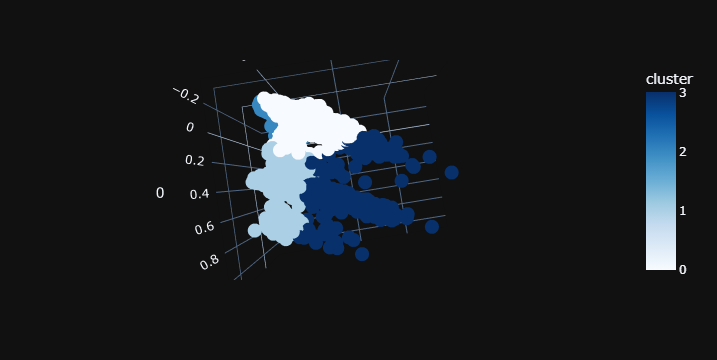

In [82]:
fig = px.scatter_3d(cluster_map, x=0, y=1, z=2,
                    color='cluster',template='plotly_dark',color_continuous_scale='Blues')

fig.show()


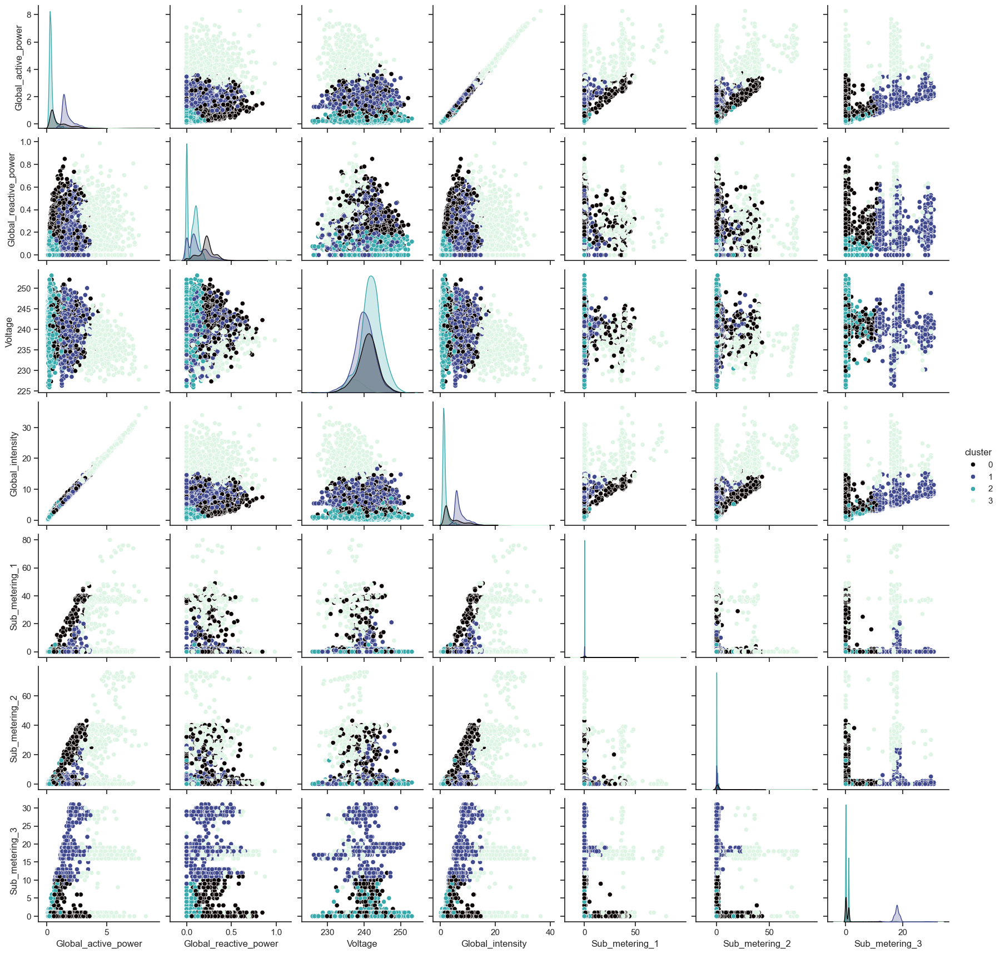

In [121]:
sns.pairplot(cluster_map.drop(columns=[0,1,2]),diag_kind = 'kde',hue='cluster',palette="mako")

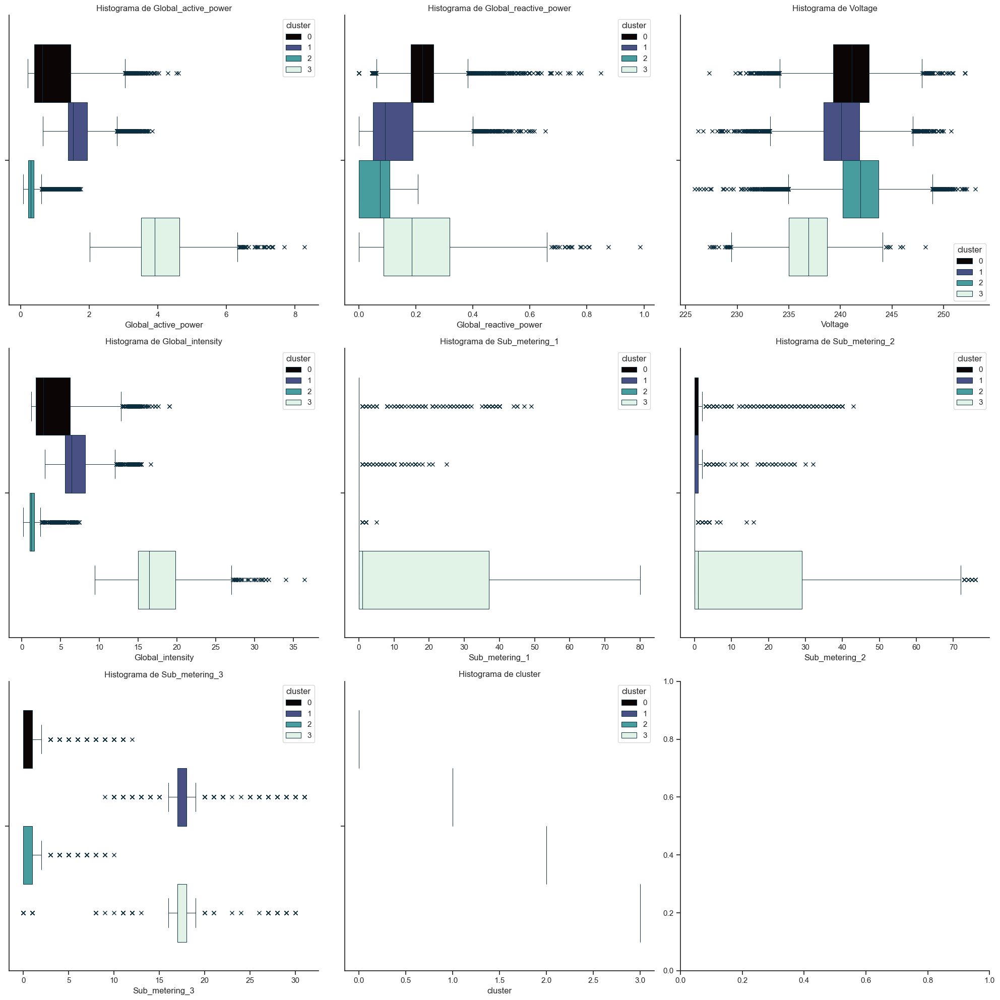

In [117]:
color_palette = ['#264653','#e9c46a','#2a9d8f', '#f4a261', '#e76f51', '#8a5a44']
sns.set_palette(sns.color_palette(color_palette))

num_cols = cluster_map.drop(columns=[0,1,2]).select_dtypes(include='number').columns
num_plots = len(num_cols)

quant_col = cluster_map.select_dtypes(['int','float']).columns.tolist()

fig, axes = plt.subplots(nrows=(num_plots // 3) + 1, ncols=3, figsize=(20, 20))
axes = axes.flatten()

for i, col in enumerate(num_cols):
    sns.boxplot(data=cluster_map, x=col,linecolor="#0b2d3e",palette="mako",hue='cluster',linewidth=.7,flierprops={"marker": "x"}, ax=axes[i])
    axes[i].set_title(f'Histograma de {col}')
    axes[i].grid(False)

plt.tight_layout()
plt.show()

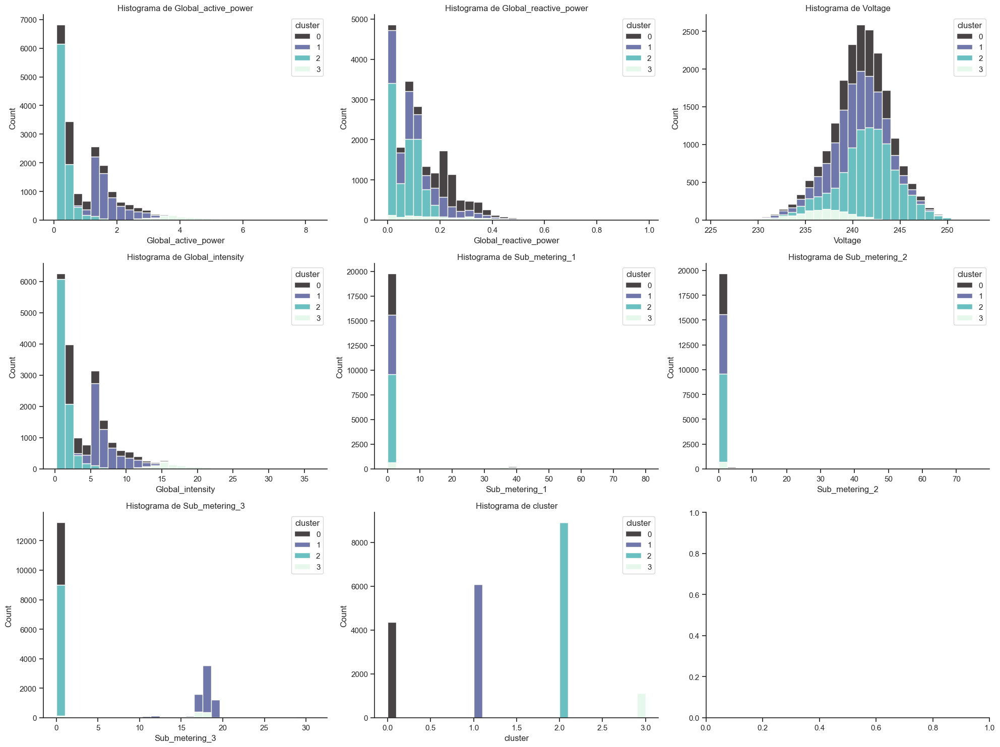

In [119]:


fig, axes = plt.subplots(nrows=(num_plots // 3) + 1, ncols=3, figsize=(20, 15))
axes = axes.flatten()

for i, col in enumerate(num_cols):
    sns.histplot(data=cluster_map, x=col, hue='cluster',palette="mako" ,bins=30, ax=axes[i], kde=False,multiple="stack")
    axes[i].set_title(f'Histograma de {col}')
    axes[i].grid(False)

plt.tight_layout()
plt.show()

Tabelas Crosstab para Explorar Padrões entre Variáveis e Clusters
As tabelas crosstab nos ajudam a identificar padrões entre as variáveis categóricas e os grupos formados pelos clusters. Vamos começar criando uma tabela cruzada entre as variáveis categóricas e os clusters.

Exemplo de Tabela Crosstab
Podemos cruzar, por exemplo, os clusters com a variável Global_active_power e observar a distribuição entre os clusters:

In [135]:
pd.crosstab(cluster_map['cluster'], cluster_map['Global_active_power'], normalize='index')


Global_active_power,0.078,0.080,0.082,0.084,0.086,0.088,0.092,0.096,0.098,0.100,...,7.118,7.128,7.224,7.228,7.230,7.314,7.348,7.354,7.682,8.274
cluster,,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.000897,0.006055,0.005495,0.000449,0.000336,0.000224,0.000112,0.000112,0.000224,0.000673,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000894,0.000894,0.000894,0.000894,0.000894,0.000894,0.000894,0.000894,0.000894,0.000894


In [147]:
cluster_map['Voltage_qcut'] = pd.qcut(cluster_map['Voltage'], q=4, labels=['Baixo', 'Médio', 'Alto', 'Muito Alto'])

pd.crosstab(cluster_map['cluster'], cluster_map['Voltage_qcut'])

Voltage_qcut,Baixo,Médio,Alto,Muito Alto
cluster,,,,
0,974,1164,1223,1007
1,2043,1850,1310,884
2,1246,1947,2514,3211
3,877,165,59,18


In [149]:
cluster_map['Global_active_power_qcut'] = pd.qcut(cluster_map['Global_active_power'], q=4, labels=['Baixo', 'Médio', 'Alto', 'Muito Alto'])

pd.crosstab(cluster_map['cluster'], cluster_map['Global_active_power_qcut'])

Global_active_power_qcut,Baixo,Médio,Alto,Muito Alto
cluster,,,,
0,296,1860,1218,994
1,0,0,3124,2963
2,4838,3257,788,35
3,0,0,0,1119


**Interpretação dos Resultados de Crosstab**
**Distribuição de Voltage por Cluster:**

- O cluster 0 tem uma distribuição razoavelmente uniforme entre as categorias de Voltage, com um número similar de observações nas categorias "Baixo", "Médio", "Alto", e "Muito Alto".
- O cluster 1 tem um número maior de observações na categoria "Baixo" e "Médio", mas significativamente menos em "Alto" e "Muito Alto".
- O cluster 2 tem uma concentração muito maior em "Alto" e "Muito Alto", sugerindo que os dados deste cluster tendem a ter voltagens mais altas.
- O cluster 3 tem a maioria das observações nas categorias "Baixo" e "Médio", com pouquíssimas em "Alto" e "Muito Alto".

**Distribuição de Global_active_power por Cluster:**

- O cluster 0 está mais equilibrado entre as categorias de Global_active_power.
- O cluster 1 tem uma grande quantidade de observações em "Alto" e "Muito Alto", sugerindo que os dados nesse cluster têm potências ativas mais altas.
- O cluster 2 é composto majoritariamente pela categoria "Baixo", com uma diminuição gradual nas outras categorias.
- O cluster 3 é formado inteiramente pela categoria "Muito Alto", o que pode indicar uma segmentação clara para altos valores de potência ativa.

In [156]:
pd.crosstab(cluster_map['cluster'], cluster_map['Sub_metering_1'], normalize='index')

Sub_metering_1,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,...,57.0,65.0,68.0,71.0,72.0,73.0,74.0,75.0,76.0,80.0
cluster,,,,,,,,,,,,,,,,,,,,,
0,0.897665,0.043727,0.012363,0.000687,0.000458,0.000687,0.000000,0.000000,0.000687,0.000229,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.902086,0.072285,0.019714,0.000493,0.000329,0.000329,0.000493,0.000493,0.000329,0.000164,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.982507,0.015026,0.002355,0.000000,0.000000,0.000112,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.470063,0.095621,0.014298,0.001787,0.000894,0.000894,0.001787,0.000000,0.001787,0.000000,...,0.000894,0.000894,0.001787,0.000894,0.000894,0.000894,0.000894,0.000894,0.002681,0.000894


In [158]:
pd.crosstab(cluster_map['cluster'], cluster_map['Sub_metering_2'], normalize='index')

Sub_metering_2,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,...,66.0,67.0,68.0,70.0,71.0,72.0,73.0,74.0,75.0,76.0
cluster,,,,,,,,,,,,,,,,,,,,,
0,0.452152,0.337454,0.152930,0.004579,0.004350,0.004579,0.001145,0.000229,0.000916,0.000916,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.730902,0.179399,0.069985,0.004600,0.004600,0.003121,0.001971,0.000329,0.000164,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.833146,0.120206,0.043732,0.001458,0.001009,0.000000,0.000112,0.000112,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.423592,0.151921,0.063450,0.007149,0.003575,0.007149,0.001787,0.000000,0.000894,0.000000,...,0.000894,0.000894,0.000894,0.001787,0.004468,0.003575,0.008937,0.002681,0.003575,0.002681


In [160]:
pd.crosstab(cluster_map['cluster'], cluster_map['Sub_metering_3'], normalize='index')

Sub_metering_3,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,...,22.0,23.0,24.0,25.0,26.0,27.0,28.0,29.0,30.0,31.0
cluster,,,,,,,,,,,,,,,,,,,,,
0,0.616300,0.357601,0.002518,0.001603,0.002060,0.002747,0.003434,0.001832,0.003663,0.003892,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000164,...,0.000821,0.000164,0.000164,0.000657,0.001150,0.001807,0.007064,0.008871,0.005093,0.000821
2,0.645212,0.348397,0.002131,0.000449,0.000785,0.001121,0.000449,0.000673,0.000336,0.000336,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.087578,0.031278,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.002681,0.000894,...,0.000000,0.000894,0.000894,0.000000,0.000894,0.005362,0.006256,0.007149,0.002681,0.000000


As variáveis **Sub_metering_1**, **Sub_metering_2** e **Sub_metering_3** medem o consumo de energia em três diferentes categorias de eletrodomésticos ou zonas de uma casa. Os **clusters (0, 1, 2, 3)** representam grupos de padrões de consumo, criados por meio de um algoritmo de clusterização .

**O que significam as proporções:**

Cada célula nas tabelas mostra a proporção de observações dentro de cada cluster para um valor específico da variável Sub_metering.

**Por exemplo:**

**Tabela de Sub_metering_1 (Consumo em uma zona específica)**
- **Para o cluster 0:**
    - 89,77% das observações nesse cluster têm o valor 0.0 de consumo em Sub_metering_1, o que significa que a grande maioria das casas ou dispositivos nesse cluster não consomem energia na zona representada por Sub_metering_1.
    - 4,37% têm o valor 1.0, ou seja, uma pequena fração de consumidores nesse cluster tem um baixo consumo.
- **Para o cluster 3:**
    - 47,01% das observações têm o valor 0.0, ou seja, menos da metade dos consumidores nesse grupo não consome energia nessa zona.
    - 9,56% têm o valor 1.0, indicando que mais pessoas nesse cluster consomem energia comparado ao cluster 0.

**O que isso significa?**

- O cluster 0 representa um grupo onde a maioria não consome energia em Sub_metering_1. Isso pode representar, por exemplo, casas que não têm aparelhos ligados a essa zona.

- Já o cluster 3 tem uma distribuição mais dispersa, com uma proporção menor de consumo zero, indicando que há mais variação no consumo de energia nessa zona.

**Tabela de Sub_metering_2 (Consumo em outra zona específica)**

- **Para o cluster 0:**

    - 45,22% das casas têm consumo zero, indicando uma maior diversidade de padrões de consumo.
    - 33,74% consomem 1.0 unidade de energia, o que significa que uma boa parte dos consumidores nesse grupo tem um consumo relativamente baixo.
      
- **Para o cluster 2:**

    - 83,31% das observações têm consumo zero, sugerindo que a maioria das casas nesse cluster não consome energia nessa zona.
  
**O que isso significa?**

- O cluster 0 tem um consumo mais variado e não tão concentrado no valor zero, indicando que há um uso mais ativo da zona de Sub_metering_2.
- O cluster 2, por outro lado, possui um grande número de consumidores com consumo zero, o que pode representar um grupo de pessoas que quase não utilizam essa área da casa.
  
**Tabela de Sub_metering_3 (Consumo em uma terceira zona)**

- O cluster 2 tem 64,52% de consumidores com consumo zero, indicando que a maioria não consome energia nessa área.
- Já o cluster 3 tem apenas 8,76% com consumo zero, o que significa que nesse grupo, a maioria dos consumidores está usando ativamente a zona representada por Sub_metering_3.

**Conclusão prática:**
Essas tabelas nos mostram como diferentes grupos de consumidores (clusters) utilizam energia nas três zonas representadas por Sub_metering_1, Sub_metering_2 e Sub_metering_3. Os clusters ajudam a identificar padrões de comportamento:

- Alguns grupos podem ter um baixo consumo em todas as áreas (como o cluster 2).
- Outros grupos têm mais variabilidade, com uma distribuição maior entre diferentes níveis de consumo (como o cluster 3).
  
**Em resumo:**
As tabelas crosstab te mostram como cada grupo de consumidores (clusters) se comporta em termos de consumo de energia. O objetivo é identificar padrões, como:

- Qual cluster consome mais ou menos energia em certas zonas da casa?
- Como o consumo de energia é distribuído em cada grupo?
  
Essas informações podem ser usadas para entender o comportamento de consumo e, eventualmente, propor estratégias de otimização, como programas de eficiência energética, ajustes tarifários, ou manutenção específica para cada grupo.

## Etapa 6 CRISP-DM: Deployment

Para o deployment deste projeto, vamos criar um app interativo utilizando Streamlit. O aplicativo permitirá que os usuários façam o upload de arquivos do UCI Machine Learning Repository e rodem automaticamente todas as análises desenvolvidas.

**Funcionalidades do App:**

- Upload de Arquivo: O usuário pode carregar seu dataset.
- Análises Automáticas: As análises realizadas no projeto serão executadas automaticamente.
- Visualizações Dinâmicas: Gráficos e tabelas que mostram insights sobre o consumo de energia.

Esse app proporcionará uma experiência interativa e eficiente, facilitando a exploração de dados e a geração de insights valiosos. Ademais, cabe dizer que todos os passos da CRISP-DM vão estar expecificado no nosso app.